In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [43]:
import os
print(os.environ['PATH'])

/Users/danielporras/Musica/env/bin:/usr/local/bin:/usr/local/sbin:/Library/Frameworks/Python.framework/Versions/3.12/bin:/usr/local/bin:/usr/local/sbin:/usr/local/bin:/usr/bin:/bin:/usr/sbin:/sbin:/usr/local/bin:/usr/local/bin:/Users/danielporras/Desktop/document4/ffmpeg-112441-gc06d3d2404.zip:/Users/danielporras/Desktop/document4/:/Users/danielporras/Desktop/document4/:/Users/danielporras/Desktop/document4/:/Users/danielporras/Desktop/document4/:/Users/danielporras/Desktop/document4/


### Get general information of the audio

In [44]:
from pydub import AudioSegment
AudioSegment.converter = "/Users/danielporras/Desktop/document4/ffmpeg"
AudioSegment.ffmpeg = "/Users/danielporras/Desktop/document4/ffmpeg"
AudioSegment.ffprobe = "/Users/danielporras/Desktop/document4/ffprobe"
AudioSegment.player = "/Users/danielporras/Desktop/document4/ffplay"

from pydub.playback import play

# Create an AudioSegment instance
raw_file = AudioSegment.from_file(file="/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.mp3", format="mp3")

# Check the type
print(type(raw_file))

# Play the audio file
play(raw_file)

<class 'pydub.audio_segment.AudioSegment'>


Input #0, wav, from '/var/folders/fj/mnvcnxj90n5b6b1_vdmpd3d80000gn/T/tmpr04js_ka.wav':
  Duration: 00:03:22.66, bitrate: 1411 kb/s
  Stream #0:0: Audio: pcm_s16le ([1][0][0][0] / 0x0001), 44100 Hz, 2 channels, s16, 1411 kb/s


In [45]:
# Export the .mp3 file as wav
raw_file.export(out_f="/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.wav",
                 format="wav")

<_io.BufferedRandom name='/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.wav'>

In [46]:
import librosa
import IPython.display as ipd

x, sr = librosa.load('/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.wav')
ipd.Audio(x, rate=sr)

In [47]:
from pydub import AudioSegment


In [48]:
# Load files
audio_segment = AudioSegment.from_file("/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.wav")

# Print attributes
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 202658
Frame count: 8937216.0
Intensity: -14.434587562923891


### Amplitude

In [49]:
import wave

# Open wav file and read frames as bytes
sf_filewave = wave.open('/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.wav', 'r')
signal_sf = sf_filewave.readframes(-1)

# Convert audio bytes to integers
soundwave_sf = np.frombuffer(signal_sf, dtype='int16')

# Get the sound wave frame rate
framerate_sf = sf_filewave.getframerate()

# Find the sound wave timestamps
time_sf = np.linspace(start=0,
                      stop=len(soundwave_sf)/framerate_sf,
                      num=len(soundwave_sf))

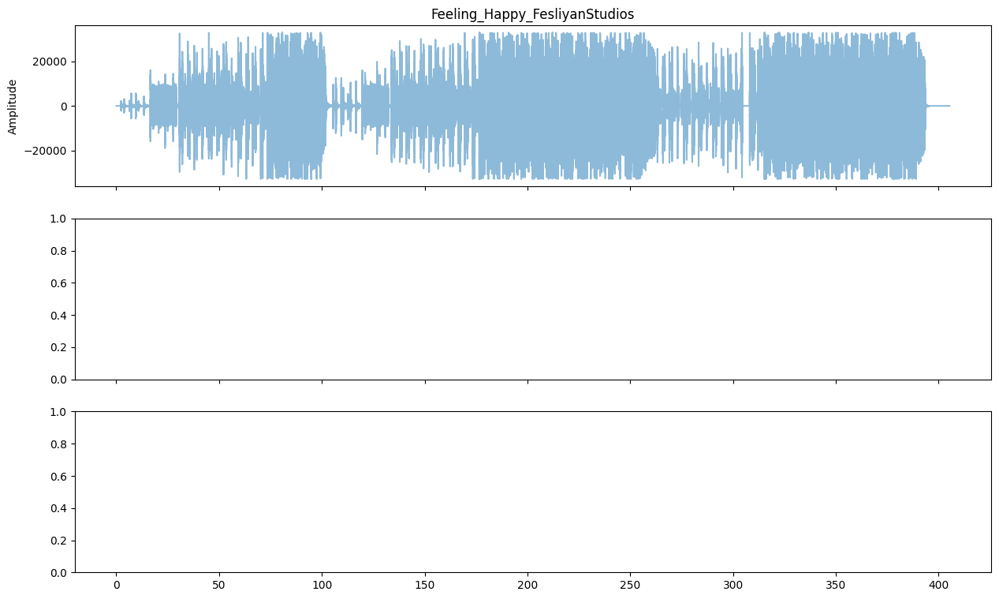

In [50]:
f, ax = plt.subplots(figsize=(15, 9), nrows=3, sharex=True)

# Add the audio data to the plot
ax[0].set(title='Feeling_Happy_FesliyanStudios', ylabel='Amplitude')
ax[0].plot(time_sf, soundwave_sf, label='', alpha=0.5)


In [51]:
#AMPLITUDE: Analyze the numeric data of the audio file 

# Print the first 10 samples
print(soundwave_sf[:10])

min_amplitude = np.min(soundwave_sf)
print("Min amplitude:", min_amplitude)

# Calculate and print the mean amplitude
mean_amplitude = np.mean(soundwave_sf)
print("Mean amplitude:", mean_amplitude)

# Calculate and print the max amplitude
max_amplitude = np.max(soundwave_sf)
print("Max amplitude:", max_amplitude)


[0 0 0 0 0 0 0 0 0 0]
Min amplitude: -32768
Mean amplitude: -0.6394023038046748
Max amplitude: 32767


In [52]:
import librosa

audio_data = '/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.wav'
x , sr = librosa.load(audio_data, sr=None)

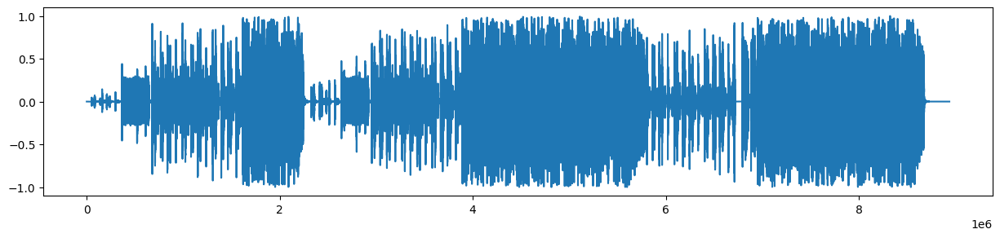

In [53]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 3))
plt.plot(x)
plt.show()

### Amplitude envelope

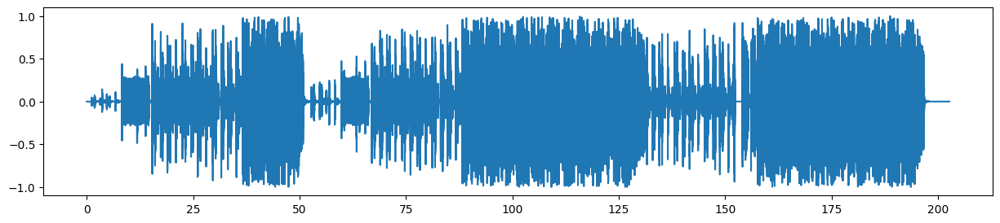

In [54]:
import numpy as np

time = np.arange(0, len(x)) / sr
plt.figure(figsize=(15, 3))
plt.plot(time, x)
plt.show()

In [55]:
mean = np.mean(x)
std = np.std(x)
min_val = np.min(x)
max_val = np.max(x)

print("Mean:", mean)
print("Standard Deviation:", std)
print("Minimum Value:", min_val)
print("Maximum Value:", max_val)

Mean: -1.951301e-05
Standard Deviation: 0.18649101
Minimum Value: -1.0
Maximum Value: 0.9999695


### Spectogram

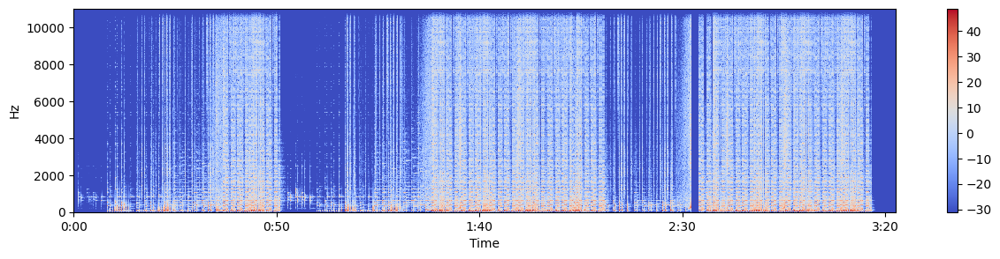

In [56]:
x, sr = librosa.load('/Users/danielporras/Musica/music_import/happy_songs/Feeling_Happy_FesliyanStudios.wav')

X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(15, 3))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

In [57]:
# Flatten the spectrogram
flattened_spectrogram = abs(X).flatten()
print("Flattened Spectrogram:", flattened_spectrogram)

# Calculate aggregate statistics
mean_spectrogram = np.mean(abs(X), axis=1)
std_spectrogram = np.std(abs(X), axis=1)

print("Mean Spectrogram:", mean_spectrogram)
print("Standard Deviation Spectrogram:", std_spectrogram)

Flattened Spectrogram: [0. 0. 0. ... 0. 0. 0.]
Mean Spectrogram: [2.5479284e-01 5.0733846e-01 1.1128801e+00 ... 5.6470581e-06 3.9691104e-06
 3.7009047e-06]
Standard Deviation Spectrogram: [5.1748753e-01 9.2504478e-01 2.1571431e+00 ... 7.2490957e-06 5.7284919e-06
 5.6810627e-06]


In [58]:


# Print the first 10 time steps of the first frequency
print(Xdb[0, :10])

# Calculate and print the mean decibel level of the first frequency
mean_db = np.mean(Xdb[0, :])
print("Mean decibel level:", mean_db)

# Calculate and print the max decibel level of the first frequency
max_db = np.max(Xdb[0, :])
print("Max decibel level:", max_db)

[-31.104813 -31.104813 -31.104813 -31.104813 -31.104813 -31.104813
 -31.104813 -31.104813 -31.104813 -31.104813]
Mean decibel level: -19.952732
Max decibel level: 18.550169


## Feature Extraction
### RMS/Energy
#### Compute root-mean-square (RMS) value for each frame, total magntiude of the signal. For audio signals, that roughly corresponds to how loud the signal is


In [59]:
y, sr = librosa.load(audio_data)


In [60]:
S, phase = librosa.magphase(librosa.stft(y))
rms = librosa.feature.rms(S=S)

[Text(0.5, 1.0, 'log Power spectrogram')]

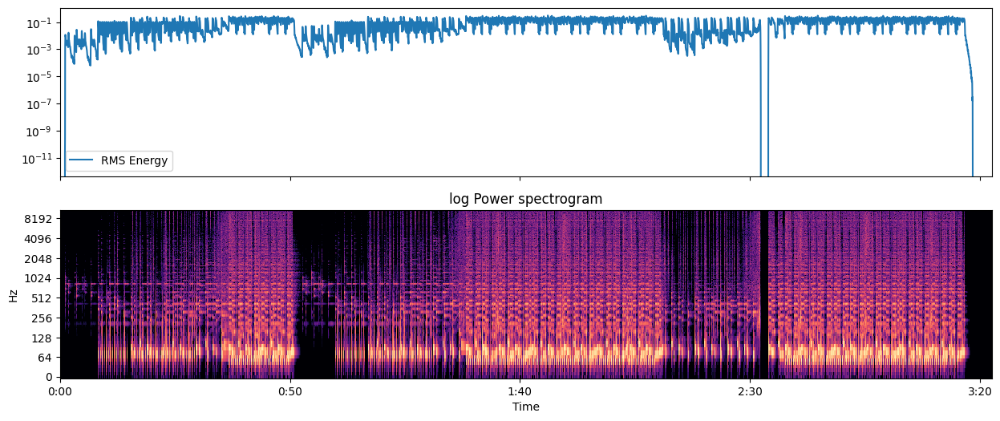

In [61]:
fig, ax = plt.subplots(figsize=(15, 6), nrows=2, sharex=True)
times = librosa.times_like(rms)
ax[0].semilogy(times, rms[0], label='RMS Energy')
ax[0].set(xticks=[])
ax[0].legend()
ax[0].label_outer()
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='log Power spectrogram')

### Zero crossing rate
#### The zero-crossing rate (ZCR) is the rate at which a signal changes from positive to zero to negative or from negative to zero to positive.[1] Its value has been widely used in both speech recognition and music information retrieval, being a key feature to classify percussive sounds

In [62]:
y, sr = librosa.load(audio_data)
zcrs = librosa.feature.zero_crossing_rate(y)

Zero crossing rate: 397185


Text(0.5, 1.0, 'Feeling_Happy_FesliyanStudios')

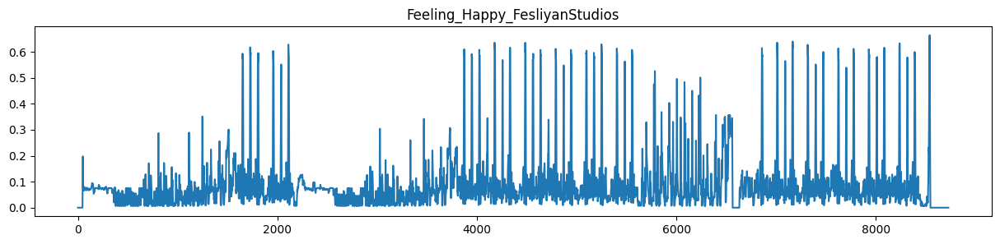

In [63]:
print(f"Zero crossing rate: {sum(librosa.zero_crossings(y))}")

plt.figure(figsize=(15, 3))
plt.plot(zcrs[0])
plt.title('Feeling_Happy_FesliyanStudios')

Text(0.5, 0, 'Time (s)')

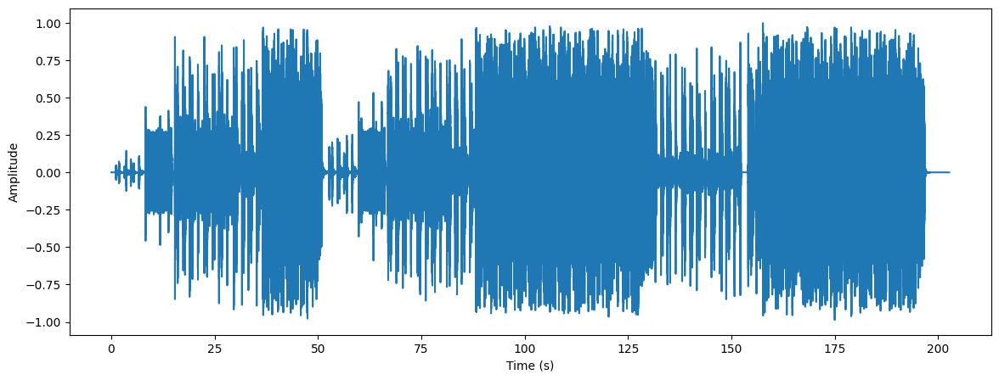

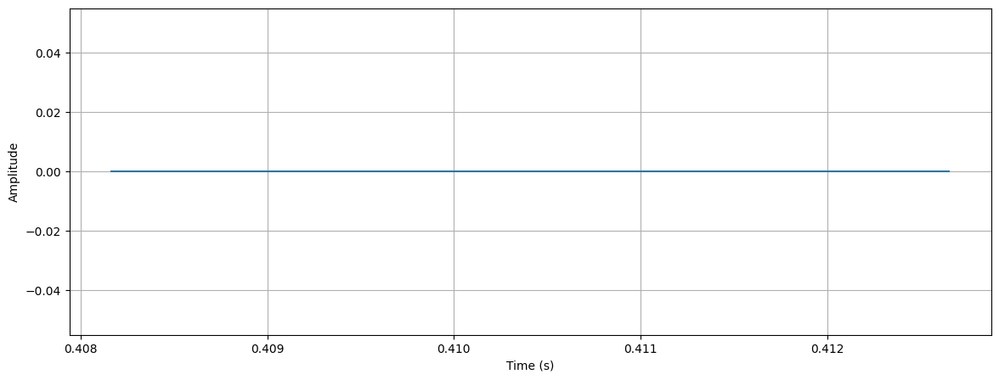

In [64]:
import matplotlib.pyplot as plt
import numpy as np

x, sr = librosa.load(audio_data)

# Generate time axis
t = np.arange(len(x)) / sr

# Plot the signal
plt.figure(figsize=(14, 5))
plt.plot(t, x)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')

# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(t[n0:n1], x[n0:n1])
plt.grid()
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')

Text(0.5, 0, 'Time (s)')

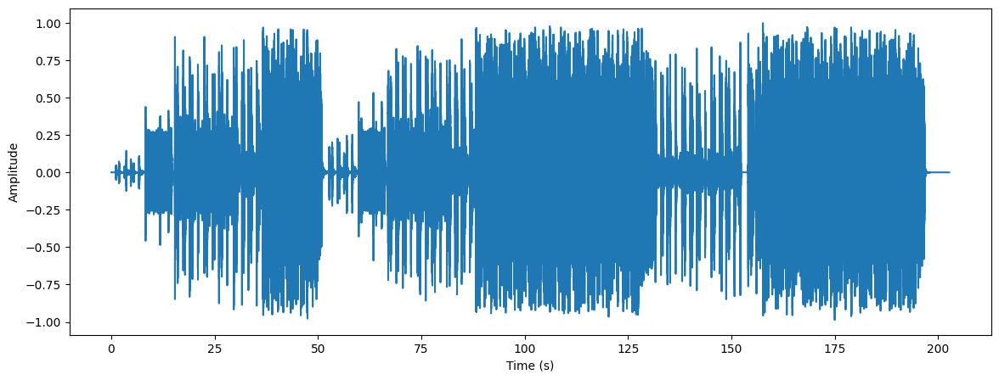

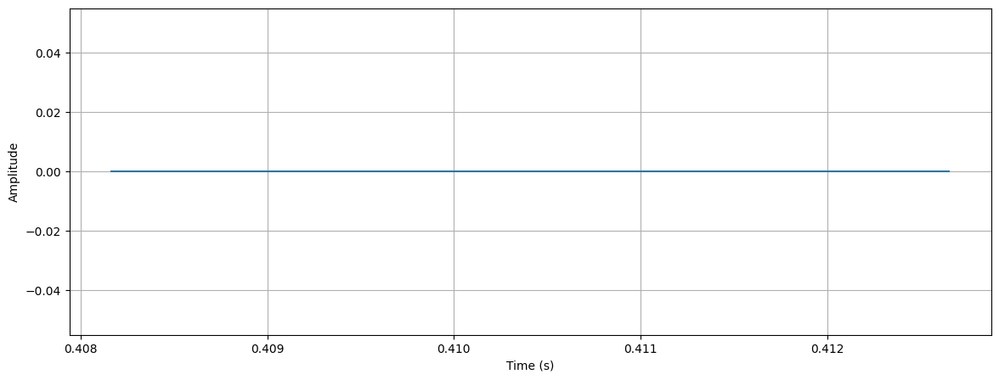

In [65]:
import matplotlib.pyplot as plt
import numpy as np

x, sr = librosa.load(audio_data)


# Generate time axis
t = np.arange(len(x)) / sr

# Plot the signal
plt.figure(figsize=(14, 5))
plt.plot(t, x)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')

# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(t[n0:n1], x[n0:n1])
plt.grid()
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')

### Mel-Frequency Cepstral Coefficients (MFCCs)
#### The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

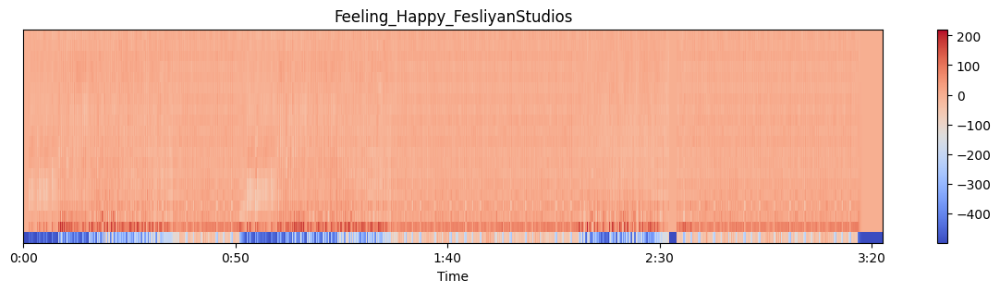

In [66]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load the audio file
x, sr = librosa.load(audio_data)

# Compute the Mel-frequency cepstral coefficients (MFCCs) of the audio signal
mfccs = librosa.feature.mfcc(y=x, sr=sr)

# Create a new figure for the plot
fig, ax = plt.subplots(figsize=(15, 3))

# Display the MFCCs as a spectrogram
img = librosa.display.specshow(mfccs, sr=sr, x_axis='time')

# Add a colorbar to the figure
fig.colorbar(img, ax=ax)

# Set the title of the plot
ax.set(title='Feeling_Happy_FesliyanStudios')

# Show the plot
plt.show()


In [67]:
import librosa

def calculate_mfcc(filepath, n_mfcc=13):
    # Load the audio file
    y, sr = librosa.load(filepath)

    # Calculate the MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)

    return mfccs

# Load the audio file
x, sr = librosa.load(audio_data)

# Calculate the MFCCs
mfccs = calculate_mfcc(audio_data)

# Print the MFCCs
print("MFCCs:", mfccs)

MFCCs: [[-499.05762 -499.05762 -499.05762 ... -499.05762 -499.05762 -499.05762]
 [   0.         0.         0.      ...    0.         0.         0.     ]
 [   0.         0.         0.      ...    0.         0.         0.     ]
 ...
 [   0.         0.         0.      ...    0.         0.         0.     ]
 [   0.         0.         0.      ...    0.         0.         0.     ]
 [   0.         0.         0.      ...    0.         0.         0.     ]]


[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

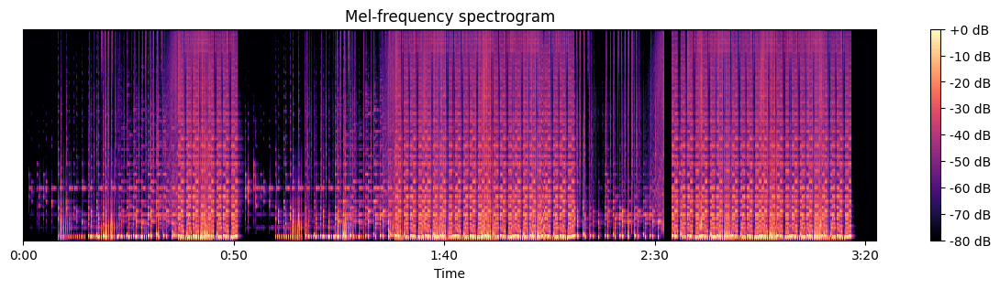

In [68]:
x, sr = librosa.load(audio_data)

S = librosa.feature.melspectrogram(y=y, sr=sr)
S_dB = librosa.power_to_db(S, ref=np.max)

fig, ax = plt.subplots(figsize=(15, 3))
# fig, ax = plt.figure(figsize=(15, 3))
img = librosa.display.specshow(S_dB, sr=sr, x_axis='time')
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')


### Chroma
#### A chroma vector is a typically a 12-element feature vector indicating how much energy of each pitch class, {C, C#, D, D#, E, ..., B}, is present in the signal

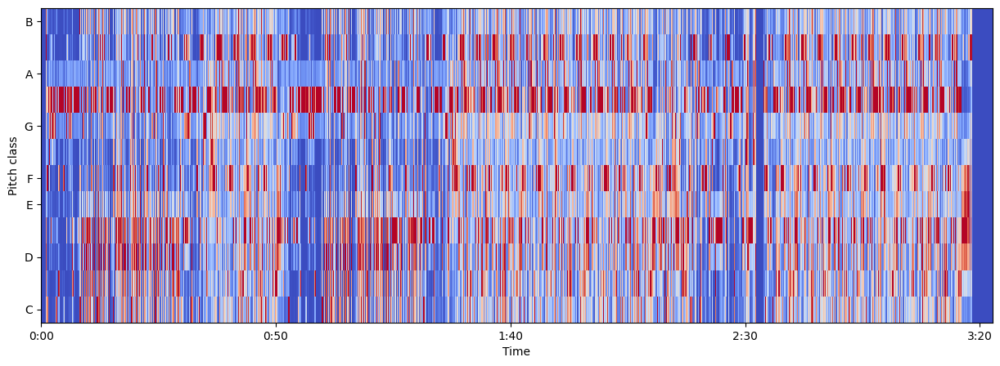

In [69]:
x, sr = librosa.load(audio_data)

hop_length = 512

chromagram = librosa.feature.chroma_stft(y=x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

### Tempogram
#### Tempo refers to the rate of the musical beat and is given by the reciprocal of the beat period. Tempo is often defined in units of beats per minute (BPM). Tempo can vary locally within a piece. Therefore, we introduce the tempogram (FMP, p. 317) as a feature matrix which indicates the prevalence of certain tempo at each moment in time.

In [70]:
y, sr = librosa.load(audio_data)
hop_length = 512

# Compute local onset autocorrelation
oenv = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
times = librosa.times_like(oenv, sr=sr, hop_length=hop_length)
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr,
                                      hop_length=hop_length)

# Estimate the global tempo for display purposes
tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr,
                           hop_length=hop_length)[0]

/var/folders/fj/mnvcnxj90n5b6b1_vdmpd3d80000gn/T/ipykernel_1628/985999882.py:11: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr,


[ 9.22582677e-02  1.32498309e-01  1.00000000e+00 -1.91976170e-16]


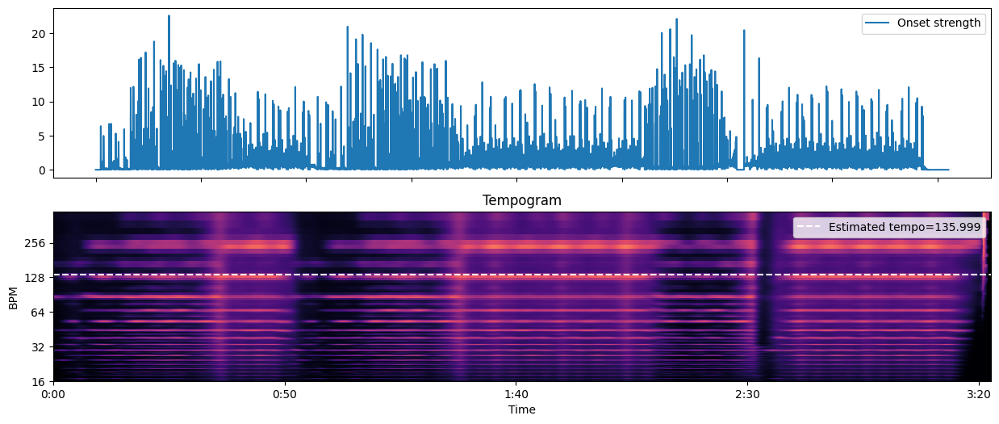

In [71]:
fig, ax = plt.subplots(nrows=2, figsize=(15, 6))

ax[0].plot(times, oenv, label='Onset strength')
ax[0].label_outer()
ax[0].legend(frameon=True)
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='tempo', cmap='magma',
                         ax=ax[1])
ax[1].axhline(tempo, color='w', linestyle='--', alpha=1,
            label='Estimated tempo={:g}'.format(tempo))
ax[1].legend(loc='upper right')
ax[1].set(title='Tempogram')

# Compute statistics for tempogram
mean_tempogram = np.mean(tempogram)
std_tempogram = np.std(tempogram)
max_tempogram = np.max(tempogram)
min_tempogram = np.min(tempogram)

# Create a feature vector for tempogram
tempogram_features = np.array([mean_tempogram, std_tempogram, max_tempogram, min_tempogram])
print(tempogram_features)

# tempogram_features = np.array([mean_tempogram, std_tempogram, max_tempogram, min_tempogram])
# print(tempogram_features)

In [72]:
import librosa
import numpy as np

# Load the audio file
y, sr = librosa.load(audio_data)

# Calculate the spectrogram
D = librosa.stft(y)
spectrogram = np.abs(D)

# Calculate the RMS energy
rms = librosa.feature.rms(y=y)

# Calculate the zero crossing rate
zcr = librosa.feature.zero_crossing_rate(y)

# Calculate the MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr)

# Calculate the chroma features
chroma = librosa.feature.chroma_stft(y=y, sr=sr)

# Calculate the tempogram
tempogram = librosa.feature.tempogram(y=y, sr=sr)

# Calculate the statistics for each feature
mean_spectrogram = np.mean(spectrogram)
std_spectrogram = np.std(spectrogram)
max_spectrogram = np.max(spectrogram)
min_spectrogram = np.min(spectrogram)

mean_rms = np.mean(rms)
std_rms = np.std(rms)
max_rms = np.max(rms)
min_rms = np.min(rms)

mean_zcr = np.mean(zcr)
std_zcr = np.std(zcr)
max_zcr = np.max(zcr)
min_zcr = np.min(zcr)

mean_mfccs = np.mean(mfccs, axis=1)
std_mfccs = np.std(mfccs, axis=1)
max_mfccs = np.max(mfccs, axis=1)
min_mfccs = np.min(mfccs, axis=1)

mean_chroma = np.mean(chroma, axis=1)
std_chroma = np.std(chroma, axis=1)
max_chroma = np.max(chroma, axis=1)
min_chroma = np.min(chroma, axis=1)

mean_tempogram = np.mean(tempogram)
std_tempogram = np.std(tempogram)
max_tempogram = np.max(tempogram)
min_tempogram = np.min(tempogram)

In [73]:
print("Spectrogram:")
print("Mean:", mean_spectrogram)
print("Standard deviation:", std_spectrogram)
print("Max:", max_spectrogram)
print("Min:", min_spectrogram)

print("RMS:")
print("Mean:", mean_rms)
print("Standard deviation:", std_rms)
print("Max:", max_rms)
print("Min:", min_rms)

print("Zero Crossing Rate:")
print("Mean:", mean_zcr)
print("Standard deviation:", std_zcr)
print("Max:", max_zcr)
print("Min:", min_zcr)

print("MFCCs:")
for i, (mean, std, max_val, min_val) in enumerate(zip(mean_mfccs, std_mfccs, max_mfccs, min_mfccs)):
    print(f"MFCC {i+1}:")
    print("Mean:", mean)
    print("Standard deviation:", std)
    print("Max:", max_val)
    print("Min:", min_val)

print("Chroma:")
for i, (mean, std, max_val, min_val) in enumerate(zip(mean_chroma, std_chroma, max_chroma, min_chroma)):
    print(f"Chroma {i+1}:")
    print("Mean:", mean)
    print("Standard deviation:", std)
    print("Max:", max_val)
    print("Min:", min_val)

print("Tempogram:")
print("Mean:", mean_tempogram)
print("Standard deviation:", std_tempogram)
print("Max:", max_tempogram)
print("Min:", min_tempogram)

Spectrogram:
Mean: 0.95843965
Standard deviation: 5.0484853
Max: 278.45776
Min: 0.0
RMS:
Mean: 0.1447086
Standard deviation: 0.11608337
Max: 0.45422575
Min: 0.0
Zero Crossing Rate:
Mean: 0.08883608250744729
Standard deviation: 0.10959374031960548
Max: 0.6640625
Min: 0.0
MFCCs:
MFCC 1:
Mean: -206.17027
Standard deviation: 162.79073
Max: 26.85694
Min: -499.05762
MFCC 2:
Mean: 71.33348
Standard deviation: 39.51358
Max: 220.8348
Min: -63.130478
MFCC 3:
Mean: 17.76395
Standard deviation: 22.095049
Max: 132.13586
Min: -72.80485
MFCC 4:
Mean: 12.908925
Standard deviation: 19.764942
Max: 66.86746
Min: -79.984726
MFCC 5:
Mean: 5.0874076
Standard deviation: 16.042866
Max: 62.490967
Min: -71.88791
MFCC 6:
Mean: 2.7778714
Standard deviation: 14.243705
Max: 39.463898
Min: -73.35799
MFCC 7:
Mean: -0.73708284
Standard deviation: 10.80888
Max: 35.41693
Min: -65.04822
MFCC 8:
Mean: 2.5438845
Standard deviation: 9.631913
Max: 42.379414
Min: -55.57499
MFCC 9:
Mean: -0.4487674
Standard deviation: 10.04400

In [74]:
import pandas as pd

# Assuming the feature values are stored in lists like mean_spectrogram, std_spectrogram, etc.
data = {
    'mean_spectrogram': [mean_spectrogram],
    'std_spectrogram': [std_spectrogram],
    'max_spectrogram': [max_spectrogram],
    'min_spectrogram': [min_spectrogram],
    'mean_rms': [mean_rms],
    'std_rms': [std_rms],
    'max_rms': [max_rms],
    'min_rms': [min_rms],
    'mean_zcr': [mean_zcr],
    'std_zcr': [std_zcr],
    'max_zcr': [max_zcr],
    'min_zcr': [min_zcr],
    'mean_tempogram': [mean_tempogram],
    'std_tempogram': [std_tempogram],
    'max_tempogram': [max_tempogram],
    'min_tempogram': [min_tempogram],
}

# Add MFCCs and Chroma features
for i in range(len(mean_mfccs)):
    data[f'mean_mfcc_{i+1}'] = [mean_mfccs[i]]
    data[f'std_mfcc_{i+1}'] = [std_mfccs[i]]
    data[f'max_mfcc_{i+1}'] = [max_mfccs[i]]
    data[f'min_mfcc_{i+1}'] = [min_mfccs[i]]

for i in range(len(mean_chroma)):
    data[f'mean_chroma_{i+1}'] = [mean_chroma[i]]
    data[f'std_chroma_{i+1}'] = [std_chroma[i]]
    data[f'max_chroma_{i+1}'] = [max_chroma[i]]
    data[f'min_chroma_{i+1}'] = [min_chroma[i]]

df = pd.DataFrame(data)

In [75]:
df

,mean_spectrogram,std_spectrogram,max_spectrogram,min_spectrogram,mean_rms,std_rms,max_rms,min_rms,mean_zcr,std_zcr,...,max_chroma_10,min_chroma_10,mean_chroma_11,std_chroma_11,max_chroma_11,min_chroma_11,mean_chroma_12,std_chroma_12,max_chroma_12,min_chroma_12
0,0.95844,5.048485,278.457764,0.0,0.144709,0.116083,0.454226,0.0,0.088836,0.109594,...,1.0,0.0,0.38858,0.348289,1.0,0.0,0.300758,0.249648,1.0,0.0


### Calculate relevant features

In [76]:
import librosa
import numpy as np

def calculate_features(filepath):
    # Load the audio file
    y, sr = librosa.load(filepath)

    # Calculate the MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr)

    # Calculate the spectral centroid
    spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)

    # Calculate the chroma feature
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)

    # Calculate the spectral contrast
    spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)

    # Calculate the tonnetz
    tonnetz = librosa.feature.tonnetz(y=y, sr=sr)

    # Calculate the zero crossing rate
    zero_crossing_rate = librosa.feature.zero_crossing_rate(y)

    # Calculate the spectral rolloff
    spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)

    # Calculate the spectral bandwidth
    spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)

    # Calculate the spectral flatness
    spectral_flatness = librosa.feature.spectral_flatness(y=y)

    # Calculate the spectral contrast
    spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)

    # Calculate the root mean square (RMS) energy for each frame
    rms = librosa.feature.rms(y=y)

    # Calculate the poly features
    poly_features = librosa.feature.poly_features(y=y, sr=sr)

    return {
        'mfccs': mfccs,
        'spectral_centroid': spectral_centroid,
        'chroma': chroma,
        'spectral_contrast': spectral_contrast,
        'tonnetz': tonnetz,
        'zero_crossing_rate': zero_crossing_rate,
        'spectral_rolloff': spectral_rolloff,
        'spectral_bandwidth': spectral_bandwidth,
        'spectral_flatness': spectral_flatness,
        'rms': rms,
        'poly_features': poly_features
    }

# Load the audio file
x, sr = librosa.load(audio_data)

# Calculate the features
features = calculate_features(audio_data)

# Print the features
for feature_name, feature_value in features.items():
    print(f"{feature_name}:\n{feature_value}\n")

mfccs:
[[-499.05762 -499.05762 -499.05762 ... -499.05762 -499.05762 -499.05762]
 [   0.         0.         0.      ...    0.         0.         0.     ]
 [   0.         0.         0.      ...    0.         0.         0.     ]
 ...
 [   0.         0.         0.      ...    0.         0.         0.     ]
 [   0.         0.         0.      ...    0.         0.         0.     ]
 [   0.         0.         0.      ...    0.         0.         0.     ]]

spectral_centroid:
[[0. 0. 0. ... 0. 0. 0.]]

chroma:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

spectral_contrast:
[[12.34372591 12.34372591 12.34372591 ... 12.34372591 12.34372591
  12.34372591]
 [12.34372591 12.34372591 12.34372591 ... 12.34372591 12.34372591
  12.34372591]
 [12.34372591 12.34372591 12.34372591 ... 12.34372591 12.34372591
  12.34372591]
 ...
 [12.34372591 12.34372591 12.34372591 ... 12.34372591 12.34372591
  12

In [78]:
import pandas as pd
import librosa
import numpy as np

def calculate_features(filepath):
    # Load the audio file
    y, sr = librosa.load(filepath)

    # Calculate the MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr)

    # Calculate the spectral centroid
    spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)

    # Calculate the chroma feature
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)

    # Calculate the spectral contrast
    spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)

    # Calculate the tonnetz
    tonnetz = librosa.feature.tonnetz(y=y, sr=sr)

    # Calculate the zero crossing rate
    zero_crossing_rate = librosa.feature.zero_crossing_rate(y)

    # Calculate the spectral rolloff
    spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)

    # Calculate the spectral bandwidth
    spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)

    # Calculate the spectral flatness
    spectral_flatness = librosa.feature.spectral_flatness(y=y)

    # Calculate the spectral contrast
    spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)

    # Calculate the root mean square (RMS) energy for each frame
    rms = librosa.feature.rms(y=y)

    # Calculate the poly features
    poly_features = librosa.feature.poly_features(y=y, sr=sr)

    # Create a DataFrame to store the features
    df = pd.DataFrame({
        'filepath': filepath,
        'mfccs': [mfccs],
        'spectral_centroid': [spectral_centroid],
        'chroma': [chroma],
        'spectral_contrast': [spectral_contrast],
        'tonnetz': [tonnetz],
        'zero_crossing_rate': [zero_crossing_rate],
        'spectral_rolloff': [spectral_rolloff],
        'spectral_bandwidth': [spectral_bandwidth],
        'spectral_flatness': [spectral_flatness],
        'rms': [rms],
        'poly_features': [poly_features]
    })

    return df

# Load the audio file
x, sr = librosa.load(audio_data)

# Calculate the features and store them in a DataFrame
df = calculate_features(audio_data)

# Print the DataFrame
print(df)

                                            filepath  \
0  /Users/danielporras/Musica/music_import/happy_...   

                                               mfccs  \
0  [[-499.05762, -499.05762, -499.05762, -499.057...   

                                   spectral_centroid  \
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                              chroma  \
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                   spectral_contrast  \
0  [[12.343725905705341, 12.343725905705341, 12.3...   

                                             tonnetz  \
0  [[-0.15825903909998015, -0.13918043039090183, ...   

                                  zero_crossing_rate  \
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                    spectral_rolloff  \
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...   

                                  spectral_bandwidth  \
0  [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 